<a href="https://colab.research.google.com/github/zrruziev/Deep_Learning_Practice/blob/main/TDC/C2_W1_Lab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Download cats_and_dogs dataset

In [1]:
!rm -rf cats_and_dogs_filtered data.zip

In [2]:
# Download the dataset
!wget --no-check-certificate https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip

# Extract the data
!unzip cats_and_dogs_filtered.zip > /dev/null

# After extracting the data, delete zip file
!rm -rf cats_and_dogs_filtered.zip

--2022-03-27 12:31:45--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.107.128, 173.194.214.128, 173.194.215.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.107.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip’

cats_and_dogs_filte 100%[===================>]  65.43M   167MB/s    in 0.4s    

2022-03-27 12:31:46 (167 MB/s) - ‘cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [3]:
import os

base_dir = 'cats_and_dogs_filtered'

print("\nContents of base directory:")
print(os.listdir(base_dir))

print("\nContents of train directory")
print(os.listdir(f'{base_dir}/train'))

print("\nContents of validation directory")
print(os.listdir(f'{base_dir}/validation'))


Contents of base directory:
['train', 'validation', 'vectorize.py']

Contents of train directory
['dogs', 'cats']

Contents of validation directory
['dogs', 'cats']


In [4]:
train_dir  = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with training cat/dogs pictures
train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with validation cats/dogs pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')


In [5]:
train_cat_fnames = os.listdir(train_cats_dir)
train_dog_fnames = os.listdir(train_dogs_dir)

print(train_cat_fnames[:10])
print(train_dog_fnames[:10])

['cat.562.jpg', 'cat.461.jpg', 'cat.706.jpg', 'cat.770.jpg', 'cat.479.jpg', 'cat.533.jpg', 'cat.294.jpg', 'cat.724.jpg', 'cat.401.jpg', 'cat.960.jpg']
['dog.29.jpg', 'dog.16.jpg', 'dog.890.jpg', 'dog.175.jpg', 'dog.698.jpg', 'dog.322.jpg', 'dog.878.jpg', 'dog.762.jpg', 'dog.234.jpg', 'dog.177.jpg']


In [6]:
print(f'total training cat images: {len(os.listdir(train_cats_dir))}')
print(f'total training dog images: {len(os.listdir(train_dogs_dir))}')

print(f'total validation cat images: {len(os.listdir(validation_cats_dir))}')
print(f'total validation dog images: {len(os.listdir(validation_dogs_dir))}')


total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500


In [7]:
%matplotlib inline

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

pic_index = 0 # Index for iterating over images

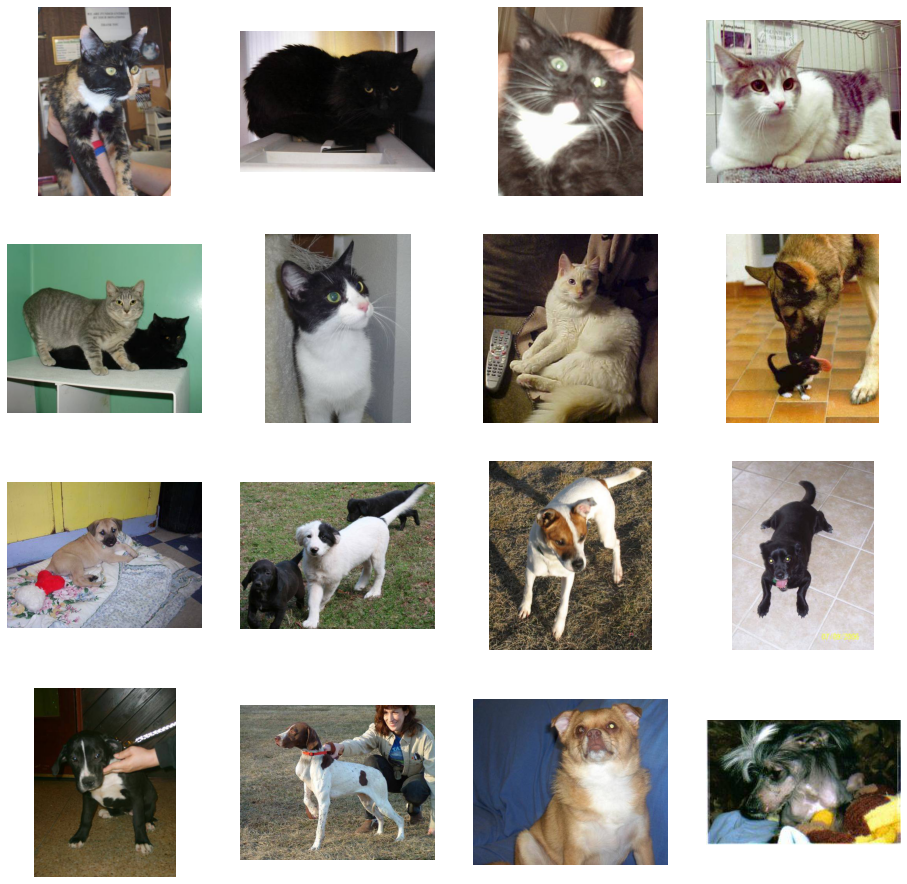

In [8]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)

pic_index+=8

next_cat_pix = [os.path.join(train_cats_dir, fname) 
                for fname in train_cat_fnames[ pic_index-8:pic_index] 
               ]

next_dog_pix = [os.path.join(train_dogs_dir, fname) 
                for fname in train_dog_fnames[ pic_index-8:pic_index]
               ]

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

## Build a small model from scratch

In [9]:
import tensorflow as tf

model = tf.keras.Sequential([
                             
        tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(150,150,3)),
        tf.keras.layers.MaxPool2D(2,2),

        tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
        tf.keras.layers.MaxPool2D(2,2),

        tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
        tf.keras.layers.MaxPool2D(2,2),

        tf.keras.layers.Flatten(),

        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid')
        ])

In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 64)       0

In [11]:
from tensorflow.keras.optimizers import RMSprop

model.compile(optimizer = RMSprop(learning_rate = 0.001),
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# This ImageDataGenerator class allows you to instantiate generators
# of augmented image batches (and their labels) via .flow(data, labels) or .flow_from_directory(directory).

# All images rescaled bt 1.0/255.0
train_datagen = ImageDataGenerator(rescale=1.0/255.0)
validation_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_generator = train_datagen.flow_from_directory(
                                train_dir,
                                batch_size=20,
                                class_mode='binary',
                                target_size=(150,150))

validation_generator = validation_datagen.flow_from_directory(
                                validation_dir,
                                batch_size=10,
                                class_mode='binary',
                                target_size=(150,150))

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


##Prepare Tensorboard

In [13]:
import datetime

log_dir = 'tf_logs/' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [14]:
hist = model.fit(
            train_generator,
            epochs=15,
            validation_data=validation_generator,
            callbacks=[tensorboard])

Epoch 1/15
100/100 [==============================] - 23s 111ms/step - loss: 0.8257 - accuracy: 0.5415 - val_loss: 0.7298 - val_accuracy: 0.5430
Epoch 2/15
100/100 [==============================] - 11s 110ms/step - loss: 0.6543 - accuracy: 0.6470 - val_loss: 0.5938 - val_accuracy: 0.6940
Epoch 3/15
100/100 [==============================] - 11s 108ms/step - loss: 0.5682 - accuracy: 0.7070 - val_loss: 0.5808 - val_accuracy: 0.6800
Epoch 4/15
100/100 [==============================] - 12s 117ms/step - loss: 0.4805 - accuracy: 0.7775 - val_loss: 0.6253 - val_accuracy: 0.6820
Epoch 5/15
100/100 [==============================] - 11s 110ms/step - loss: 0.4157 - accuracy: 0.8105 - val_loss: 0.7530 - val_accuracy: 0.6950
Epoch 6/15
100/100 [==============================] - 11s 112ms/step - loss: 0.3312 - accuracy: 0.8605 - val_loss: 0.8662 - val_accuracy: 0.6580
Epoch 7/15
100/100 [==============================] - 11s 109ms/step - loss: 0.2395 - accuracy: 0.9030 - val_loss: 0.7387 - val_ac

In [15]:
%load_ext tensorboard
%tensorboard --logdir tf_logs

<IPython.core.display.Javascript object>

##Model Prediction

In [16]:
import numpy as np
from tensorflow.keras.preprocessing import image

from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
    path = '/content/' + fn
    img = image.load_img(path, target_size=(150,150))

    x = image.img_to_array(img)
    x /=255
    x = np.expand_dims(x, axis=0)
    images = np.vstack([x])

    classes = model.predict(images, batch_size=10)

    print(f'\nppredicted_class_score: {classes}')

    if classes[0] > .5:
        print(fn + 'is a dog')
    else:
        print(fn + 'is a cat')


Saving cat1.jpg to cat1.jpg
Saving cat2.jpg to cat2.jpg
Saving dog1.jpg to dog1.jpg
Saving dog2.jpg to dog2.jpg

ppredicted_class_score: [[0.9546157]]
cat1.jpgis a dog

ppredicted_class_score: [[0.00189594]]
cat2.jpgis a cat

ppredicted_class_score: [[0.99949276]]
dog1.jpgis a dog

ppredicted_class_score: [[1.]]
dog2.jpgis a dog


##Visualizing Intermediate Representations

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in true_divide


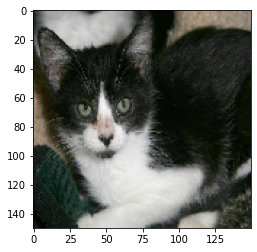

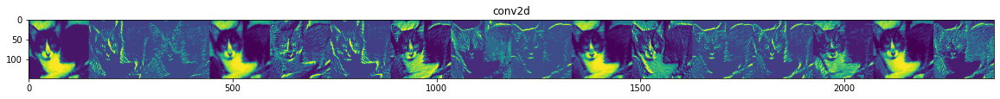

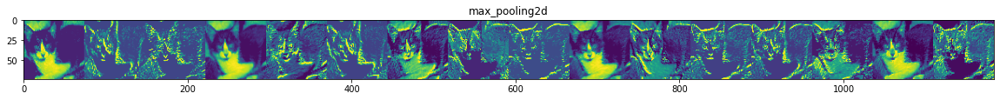

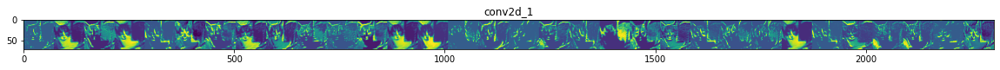

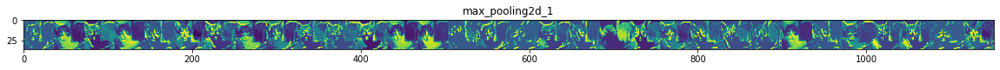

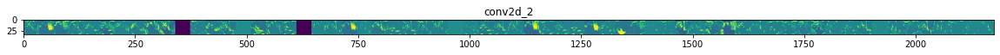

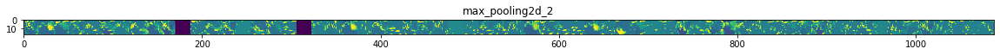

In [21]:
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model
successive_outputs = [layer.output for layer in model.layers]
visualization_model = tf.keras.models.Model(inputs = model.input, outputs = successive_outputs)

# Prepare a random input image from the training set.
cat_img_files = [os.path.join(train_cats_dir, f) for f in train_cat_fnames]
dog_img_files = [os.path.join(train_dogs_dir, f) for f in train_dog_fnames]
img_path = random.choice(cat_img_files + dog_img_files)
img = load_img(img_path, target_size=(150, 150))  # this is a PIL image
# #####################################################################
plt.imshow(img)
# #####################################################################
x   = img_to_array(img)                           # Numpy array with shape (150, 150, 3)
x   = x.reshape((1,) + x.shape)                   # Numpy array with shape (1, 150, 150, 3)

# Scale by 1/255
x /= 255.0

# Run the image through the network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)

# These are the names of the layers, so you can have them as part of our plot
layer_names = [layer.name for layer in model.layers]

# Display the representations
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  
  if len(feature_map.shape) == 4:
    
    #-------------------------------------------
    # Just do this for the conv / maxpool layers, not the fully-connected layers
    #-------------------------------------------
    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
    
    # Tile the images in this matrix
    display_grid = np.zeros((size, size * n_features))
    
    #-------------------------------------------------
    # Postprocess the feature to be visually palatable
    #-------------------------------------------------
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      display_grid[:, i * size : (i + 1) * size] = x # Tile each filter into a horizontal grid

    #-----------------
    # Display the grid
    #-----------------
    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' ) 